In [6]:
import pygad
import math
import time

maze = [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0],
        [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0],
        [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
        [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0],
        [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0],
        [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0 ,0],
        [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0],
        [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0],
        [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0],
        [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]

In [7]:
#definiujemy parametry chromosomu
#0-gora, 1-prawo, 2-dol, 3-lewo
gene_space = [0, 1, 2, 3]

In [8]:
def distance(startX, startY, endX, endY):
    return math.fabs(endX - startX) + math.fabs(endY - startY)

#definiujemy funkcję fitness
def fitness_func(ga_instance, solution, solution_idx):
    start = {'x': 1, 'y': 1}
    end = {'x': 10, 'y': 10}
    moves = 0
    repeats = 0
    walls = 0
    for i in range(len(solution)):
        if solution[i] == 0:
            if maze[start['y']-1][start['x']] == 1:
                if i != 0 and solution[i-1] == 2:
                    repeats += 1
                else: 
                    start['y'] -= 1
            else:
                walls += 1
        elif solution[i] == 1:
            if maze[start['y']][start['x']+1] == 1:
                if i != 0 and solution[i-1] == 3:
                    repeats += 1
                else: 
                    start['x'] += 1
            else:
                walls += 1
        elif solution[i] == 2:
            if maze[start['y']+1][start['x']] == 1:
                if i != 0 and solution[i-1] == 0:
                    repeats += 1
                else: 
                    start['y'] += 1
            else:
                walls += 1
        elif solution[i] == 3:
            if maze[start['y']][start['x']-1] == 1:
                if i != 0 and solution[i-1] == 1:
                    repeats += 1
                else: 
                    start['x'] -= 1
            else:
                walls += 1
        moves += 1
        if start == end:
            break

    fitness = -(distance(start['x'], start['y'], end['x'], end['y']) + moves + repeats + walls)
    return fitness
    
fitness_function = fitness_func

In [9]:
#ile chromosomów w populacji
#ile genow ma chromosom
sol_per_pop = 300
num_genes = 30

#ile wylaniamy rodzicow do "rozmnazania" (okolo 50% populacji)
#ile pokolen
#ilu rodzicow zachowac (kilka procent)
num_parents_mating = 150
num_generations = 300
keep_parents = 15

#jaki typ selekcji rodzicow?
#sss = steady, rws=roulette, rank = rankingowa, tournament = turniejowa
parent_selection_type = "sss"

#w ilu punktach robic krzyzowanie?
crossover_type = "single_point"

#mutacja ma dzialac na ilu procent genow?
#trzeba pamietac ile genow ma chromosom
mutation_type = "random"
mutation_percent_genes = 2

In [10]:
#inicjacja algorytmu z powyzszymi parametrami wpisanymi w atrybuty
ga_instance = pygad.GA(gene_space=gene_space,
                    num_generations=num_generations,
                    num_parents_mating=num_parents_mating,
                    fitness_func=fitness_function,
                    sol_per_pop=sol_per_pop,
                    num_genes=num_genes,
                    parent_selection_type=parent_selection_type,
                    keep_parents=keep_parents,
                    crossover_type=crossover_type,
                    mutation_type=mutation_type,
                    mutation_percent_genes=mutation_percent_genes)

startTime = time.time()
ga_instance.run()
endTime = time.time()

print("Time taken to run the GA : ", endTime-startTime)

[0. 1. 2. 1. 3. 0. 0. 0. 1. 3. 0. 1. 1. 2. 1. 2. 1. 2. 0. 3. 0. 1. 0. 3.
 1. 1. 2. 3. 2. 1.]
[1. 1. 1. 3. 2. 3. 2. 3. 1. 2. 0. 2. 3. 3. 3. 0. 0. 0. 3. 3. 0. 1. 2. 0.
 2. 0. 0. 1. 2. 3.]
[3. 1. 1. 0. 1. 1. 0. 2. 0. 1. 2. 0. 1. 3. 1. 1. 2. 1. 2. 0. 0. 2. 3. 1.
 3. 0. 0. 0. 1. 0.]
[1. 2. 3. 2. 0. 3. 0. 3. 1. 1. 2. 1. 3. 1. 1. 3. 1. 1. 1. 2. 1. 2. 3. 1.
 2. 0. 1. 1. 3. 3.]
[0. 2. 3. 0. 1. 0. 3. 2. 1. 2. 1. 0. 1. 3. 0. 1. 0. 3. 1. 2. 0. 1. 1. 1.
 3. 3. 0. 3. 0. 0.]
[3. 2. 0. 0. 0. 3. 1. 0. 1. 1. 2. 2. 3. 2. 2. 3. 2. 2. 3. 3. 0. 0. 0. 2.
 0. 3. 2. 0. 0. 3.]
[2. 2. 3. 2. 1. 0. 3. 0. 0. 2. 0. 1. 3. 3. 1. 3. 0. 2. 3. 0. 0. 3. 1. 0.
 2. 3. 3. 3. 2. 2.]
[3. 3. 0. 1. 3. 3. 0. 2. 3. 0. 2. 1. 3. 3. 0. 2. 3. 2. 2. 2. 3. 2. 0. 0.
 0. 0. 0. 3. 1. 1.]
[1. 0. 0. 0. 1. 3. 1. 3. 0. 2. 0. 3. 0. 2. 1. 0. 2. 1. 1. 1. 1. 1. 2. 1.
 1. 0. 2. 1. 3. 3.]
[3. 0. 0. 1. 0. 3. 1. 2. 1. 3. 2. 0. 0. 0. 1. 3. 2. 1. 1. 2. 1. 1. 2. 0.
 0. 1. 0. 2. 3. 1.]
[1. 2. 0. 2. 0. 1. 3. 1. 2. 0. 0. 2. 2. 0. 0. 1. 2. 3. 0. 1. 2. 1. 2. 

[1. 2. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 1. 2. 1. 1. 2. 1. 1. 2. 2. 2. 1. 2.
 0. 1. 1. 2. 1. 1.]
[1. 0. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 2. 2. 1. 0. 2. 1. 1. 2. 2. 2. 2. 1.
 2. 0. 2. 1. 3. 1.]
[1. 2. 1. 2. 1. 1. 0. 1. 1. 2. 3. 2. 3. 2. 1. 2. 1. 1. 2. 2. 1. 2. 2. 3.
 2. 3. 1. 0. 2. 1.]
[0. 1. 1. 0. 1. 1. 0. 1. 1. 2. 2. 2. 3. 2. 1. 2. 1. 1. 2. 2. 1. 2. 2. 3.
 2. 3. 1. 2. 2. 3.]
[0. 1. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 2. 2. 1. 1. 2. 1. 2. 2. 0. 1. 3. 2.
 3. 3. 2. 1. 3. 1.]
[0. 1. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 2. 2. 1. 1. 2. 1. 2. 2. 0. 1. 1. 2.
 1. 3. 2. 0. 0. 2.]
[1. 1. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 2. 2. 1. 2. 1. 2. 1. 3. 2. 2. 1. 2.
 1. 3. 1. 1. 3. 2.]
[0. 1. 1. 2. 1. 1. 0. 1. 1. 2. 2. 2. 0. 2. 1. 1. 2. 1. 1. 2. 3. 1. 1. 2.
 2. 3. 2. 3. 1. 3.]
[1. 0. 1. 2. 1. 1. 0. 1. 1. 2. 0. 2. 2. 2. 2. 2. 1. 0. 2. 1. 1. 2. 1. 2.
 2. 3. 2. 2. 1. 2.]
[1. 2. 1. 2. 1. 1. 0. 1. 1. 2. 0. 2. 2. 1. 2. 2. 1. 1. 2. 1. 2. 1. 2. 1.
 2. 2. 2. 1. 2. 1.]
[1. 2. 1. 2. 1. 1. 0. 0. 1. 2. 2. 2. 2. 2. 1. 1. 2. 1. 1. 3. 2. 1. 2. 

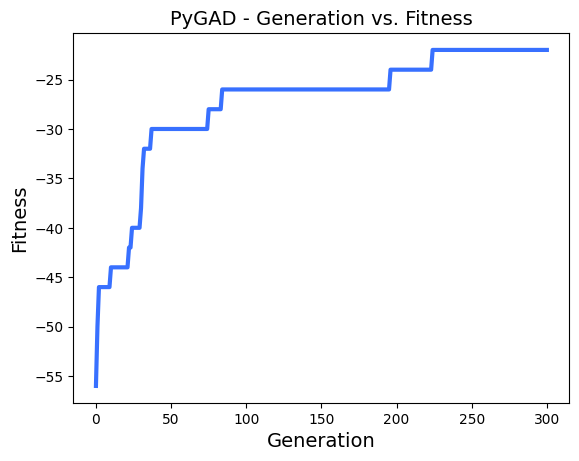

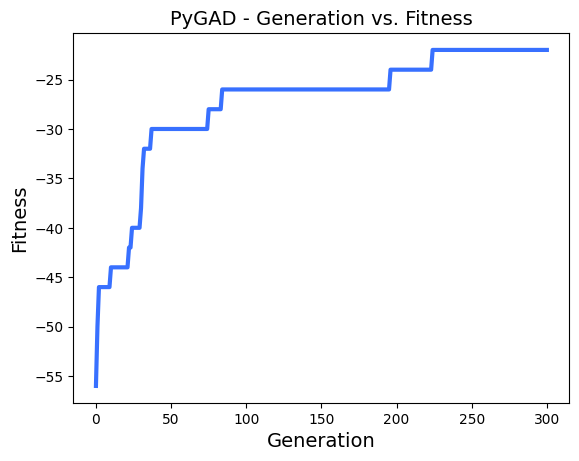

In [11]:
#podsumowanie: najlepsze znalezione rozwiazanie (chromosom+ocena)
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))
print("Number of generations passed is {generations_completed}".format(generations_completed=ga_instance.generations_completed))

#wyswietlenie wykresu: jak zmieniala sie ocena na przestrzeni pokolen
ga_instance.plot_fitness()